# Edge-to-Image Translation Using Conditional GAN

<img src="https://miro.medium.com/v2/resize:fit:1400/1*yO9fLGCR9mOgTVWUKiYQSQ.png" alt="Image" width="1000" height="1000" style="display: block; margin: auto;">

**The Edges2Shoes dataset contains paired images of shoe edges (outlines or sketches) and their corresponding photo-realistic versions. The dataset is commonly used for tasks like image-to-image translation, where the model learns to generate realistic shoe images from their edge sketches. This setup is ideal for training a Conditional GAN (cGAN), where the model takes the edge sketches as conditional inputs to generate photo-realistic shoe images.**

### Importing Libraries

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Dense, Flatten, Dropout,  Concatenate,LeakyReLU,BatchNormalization,Activation,ReLU,Conv2DTranspose
from tensorflow.keras import Model, optimizers


## Download and Load the Dataset

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("balraj98/edges2shoes-dataset")

print("Path to dataset files:", path)

100%|██████████| 2.04G/2.04G [00:22<00:00, 97.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/balraj98/edges2shoes-dataset/versions/1


In [ ]:
train_path = "/root/.cache/kagglehub/datasets/balraj98/edges2shoes-dataset/versions/1/train/*"
test_path = "/root/.cache/kagglehub/datasets/balraj98/edges2shoes-dataset/versions/1/val/*"

In [ ]:
Train_data = tf.data.Dataset.list_files(train_path, shuffle=True)
Test_data = tf.data.Dataset.list_files(test_path , shuffle=True)

In [ ]:
print("Number of training images:", tf.data.experimental.cardinality(Train_data).numpy())
print("Number of testing images:", tf.data.experimental.cardinality(Test_data).numpy())

Number of training images: 49825

Number of testing images: 200


In [ ]:
def decode_data(img):
    img = tf.io.read_file(img)
    img = tf.io.decode_jpeg(img)
    return img

Train_data = Train_data.map(decode_data)
Test_data = Test_data.map(decode_data)

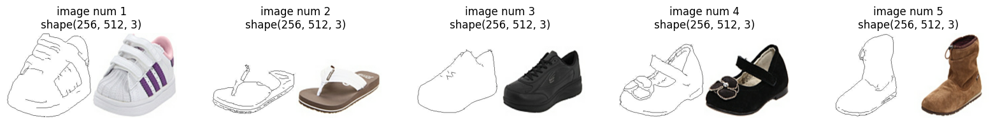

In [ ]:
def display_images(dataset, num_images=5):
    plt.figure(figsize=(20, 20))
    for i, img in enumerate(dataset.take(num_images)):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img.numpy())            # Convert the tensor to an array
        plt.title(f"image num {i+1}\nshape{img.shape}")
        plt.axis('off')

    plt.show()

display_images(Train_data, num_images=5)

* I noticed that each image consists of two parts, so I will split the image accordingly.
* The images have a shape of (256, 512, 3), where the width is 512 pixels.
* I will divide the width into two equal parts, each having a width of 256 pixels (512/2 = 256).
* The height remains the same for both parts.
* As a result, I will obtain two images, each with a shape of (256, 256, 3).

## Data Preparation : Splitting Images into Input and Target

In [ ]:
def Split_images(img):
    input_img = img[:, :256, :]
    target_img = img[:, 256:, :]
    return input_img, target_img

Train_data = Train_data.map(Split_images)
Test_data = Test_data.map(Split_images)


In [ ]:
for input_img, target_img in Train_data.take(1):
    print("Train - Input image shape:", input_img.shape)
    print("Train - Target image shape:", target_img.shape)


Train - Input image shape: (256, 256, 3)

Train - Target image shape: (256, 256, 3)


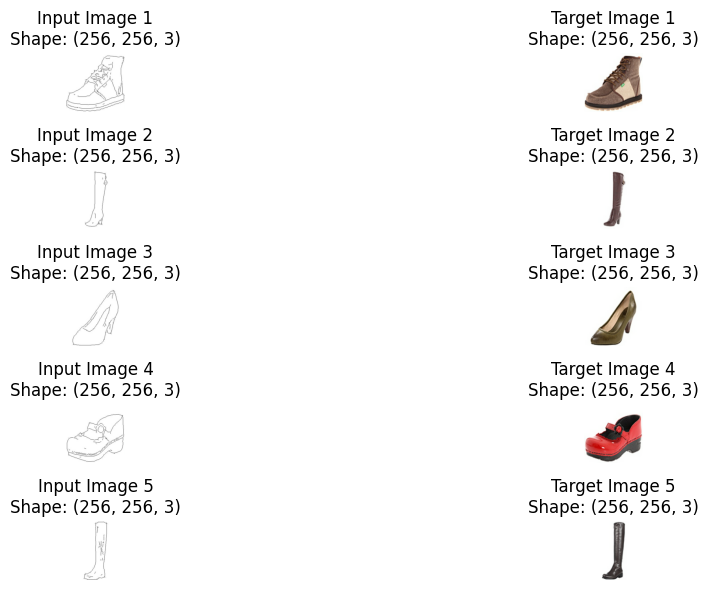

In [ ]:
def display_input_target_images(dataset, num_images=5):
    plt.figure(figsize=(15, 6))
    for i, (input_img, target_img) in enumerate(dataset.take(num_images)):
        plt.subplot(num_images, 2, i * 2 + 1)
        plt.imshow(input_img.numpy().astype('uint8'))
        plt.title(f"Input Image {i + 1}\nShape: {input_img.shape}")
        plt.axis('off')

        plt.subplot(num_images, 2, i * 2 + 2)
        plt.imshow(target_img.numpy().astype('uint8'))
        plt.title(f"Target Image {i + 1}\nShape: {target_img.shape}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

display_input_target_images(Train_data)


 ## Normalize images

In [ ]:
def get_max_min_pixel_input_target_image(dataset, index=0):
    for input_img, target_img in dataset.take(index + 1):
        input_img = input_img.numpy()
        target_img = target_img.numpy()

        # Input image
        max_input_pixel = input_img.max()
        min_input_pixel = input_img.min()

        print(f"Input Image (Index {index}):")
        print(f"  Maximum Pixel Value: {max_input_pixel}")
        print(f"  Minimum Pixel Value: {min_input_pixel}")

        # target image
        max_target_pixel = target_img.max()
        min_target_pixel = target_img.min()

        print(f"\n\nTarget Image (Index {index}):")
        print(f"  Maximum Pixel Value: {max_target_pixel}")
        print(f"  Minimum Pixel Value: {min_target_pixel}")

get_max_min_pixel_input_target_image(Train_data)


Input Image (Index 0):

  Maximum Pixel Value: 255

  Minimum Pixel Value: 0





Target Image (Index 0):

  Maximum Pixel Value: 255

  Minimum Pixel Value: 0


In [ ]:
def Normalize_images(input_img, target_img):
    input_img = tf.cast(input_img, tf.float32)
    target_img = tf.cast(target_img, tf.float32)
    input_img = (input_img - 127.5) / 127.5
    target_img = (target_img - 127.5) / 127.5
    return input_img, target_img

Train_data = Train_data.map(Normalize_images)
Test_data = Test_data.map(Normalize_images)

In [ ]:
get_max_min_pixel_input_target_image(Train_data)

Input Image (Index 0):

  Maximum Pixel Value: 1.0

  Minimum Pixel Value: -1.0





Target Image (Index 0):

  Maximum Pixel Value: 1.0

  Minimum Pixel Value: -1.0


* I normalized Data to this Range [-1,1] not [0,1] , to fit tanh fuunction (in Generator) that produces outputs between −1,1.

 ## Generator

In [ ]:
init = tf.keras.initializers.RandomNormal(stddev=0.02)

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, LeakyReLU, BatchNormalization, Dropout, Concatenate, Conv2DTranspose, Activation
from tensorflow.keras.models import Model

def Generator(input_shape=(256, 256, 3)):
    inputs = Input(shape=input_shape)

    # Encoder
    e1 = Conv2D(64, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(inputs)
    e1 = LeakyReLU(alpha=0.2)(e1)

    e2 = Conv2D(128, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e1)
    e2 = BatchNormalization()(e2)
    e2 = LeakyReLU(alpha=0.2)(e2)

    e3 = Conv2D(256, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e2)
    e3 = BatchNormalization()(e3)
    e3 = LeakyReLU(alpha=0.2)(e3)

    e4 = Conv2D(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e3)
    e4 = BatchNormalization()(e4)
    e4 = LeakyReLU(alpha=0.2)(e4)

    e5 = Conv2D(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e4)
    e5 = BatchNormalization()(e5)
    e5 = LeakyReLU(alpha=0.2)(e5)

    e6 = Conv2D(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e5)
    e6 = BatchNormalization()(e6)
    e6 = LeakyReLU(alpha=0.2)(e6)

    e7 = Conv2D(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e6)
    e7 = BatchNormalization()(e7)
    e7 = LeakyReLU(alpha=0.2)(e7)

    # Bottleneck
    b = Conv2D(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)

    # Decoder
    d1 = Conv2DTranspose(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(b)
    d1 = BatchNormalization()(d1)
    d1 = Dropout(0.5)(d1)
    d1 = Concatenate()([d1, e7])
    d1 = Activation('relu')(d1)

    d2 = Conv2DTranspose(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d1)
    d2 = BatchNormalization()(d2)
    d2 = Dropout(0.5)(d2)
    d2 = Concatenate()([d2, e6])
    d2 = Activation('relu')(d2)

    d3 = Conv2DTranspose(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d2)
    d3 = BatchNormalization()(d3)
    d3 = Dropout(0.5)(d3)
    d3 = Concatenate()([d3, e5])
    d3 = Activation('relu')(d3)

    d4 = Conv2DTranspose(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d3)
    d4 = BatchNormalization()(d4)
    d4 = Concatenate()([d4, e4])
    d4 = Activation('relu')(d4)

    d5 = Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d4)
    d5 = BatchNormalization()(d5)
    d5 = Concatenate()([d5, e3])
    d5 = Activation('relu')(d5)

    d6 = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d5)
    d6 = BatchNormalization()(d6)
    d6 = Concatenate()([d6, e2])
    d6 = Activation('relu')(d6)

    d7 = Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d6)
    d7 = BatchNormalization()(d7)
    d7 = Concatenate()([d7, e1])
    d7 = Activation('relu')(d7)

    # Output layer
    outputs = Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', activation='tanh', kernel_initializer=init)(d7)

    model = Model(inputs, outputs, name="Generator")
    return model


In [ ]:
Generator = Generator()
Generator.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 128, 128, 64)   │          3,136 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 128, 128, 64)   │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 64, 64, 128)    │        131,200 │ leaky_re_lu_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 64, 64, 128)    │            512 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_5 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 32, 32, 256)    │        524,544 │ leaky_re_lu_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 32, 32, 256)    │          1,024 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_6 (LeakyReLU) │ (None, 32, 32, 256)    │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 16, 16, 512)    │      2,097,664 │ leaky_re_lu_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 16, 16, 512)    │          2,048 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_7 (LeakyReLU) │ (None, 16, 16, 512)    │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 8, 8, 512)      │      4,194,816 │ leaky_re_lu_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 8, 8, 512)      │          2,048 │ conv2d_9[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_8 (LeakyReLU) │ (None, 8, 8, 512)      │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 4, 4, 512)      │      4,194,816 │ leaky_re_lu_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 4, 4, 512)      │          2,048 │ conv2d_10[0][0]        │
│ (BatchNormalization) 

 Total params: 54,429,315 (207.63 MB)

 Trainable params: 54,419,459 (207.59 MB)

 Non-trainable params: 9,856 (38.50 KB)

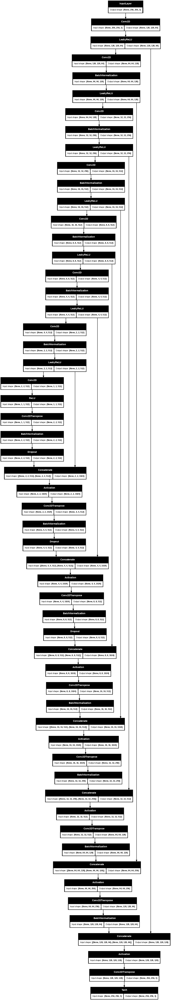

In [ ]:
tf.keras.utils.plot_model(Generator, show_shapes=True, dpi=64)

 ## Discriminator

In [ ]:
def Discriminator(input_shape=(256, 256, 3)):
    # Define inputs
    img_input = Input(shape=input_shape)
    condition_input = Input(shape=input_shape)

    # Concatenate image and condition to create a "conditioned" Discriminator
    x = Concatenate()([img_input, condition_input])

    # Convolutional layers
    d1 = Conv2D(64, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(x)
    d1 = LeakyReLU(alpha=0.2)(d1)

    d2 = Conv2D(128, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d1)
    d2 = BatchNormalization()(d2)
    d2 = LeakyReLU(alpha=0.2)(d2)

    d3 = Conv2D(256, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d2)
    d3 = BatchNormalization()(d3)
    d3 = LeakyReLU(alpha=0.2)(d3)

    d4 = Conv2D(512, kernel_size=4, strides=2, padding='same', kernel_initializer=init)(d3)
    d4 = BatchNormalization()(d4)
    d4 = LeakyReLU(alpha=0.2)(d4)

    d5 = Conv2D(512, kernel_size=4, strides=1, padding='same', kernel_initializer=init)(d4)
    d5 = BatchNormalization()(d5)
    d5 = LeakyReLU(alpha=0.2)(d5)

    # Output layer with tanh activation
    outputs = Conv2D(1, kernel_size=4, strides=1, padding='same', activation='tanh', kernel_initializer=init)(d5)

    # Define and compile the Discriminator model
    model = Model([img_input, condition_input], outputs, name="Discriminator")
    return model

In [ ]:
Discriminator = Discriminator()
Discriminator.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.

  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 256, 256, 6)    │              0 │ input_layer[0][0],     │
│                           │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 64)   │          6,208 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 128, 128, 64)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 64, 128)    │        131,200 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 64, 64, 128)    │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 64, 64, 128)    │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 256)    │        524,544 │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 32, 32, 256)    │          1,024 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 32, 32, 256)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 16, 16, 512)    │      2,097,664 │ leaky_re_lu_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 16, 16, 512)    │          2,048 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 16, 16, 512)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 16, 16, 1)      │          8,193 │ leaky_re_lu_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 16, 16, 1)      │              0 │ conv2d_4[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,771,393 (10.57 MB)

 Trainable params: 2,769,601 (10.57 MB)

 Non-trainable params: 1,792 (7.00 KB)

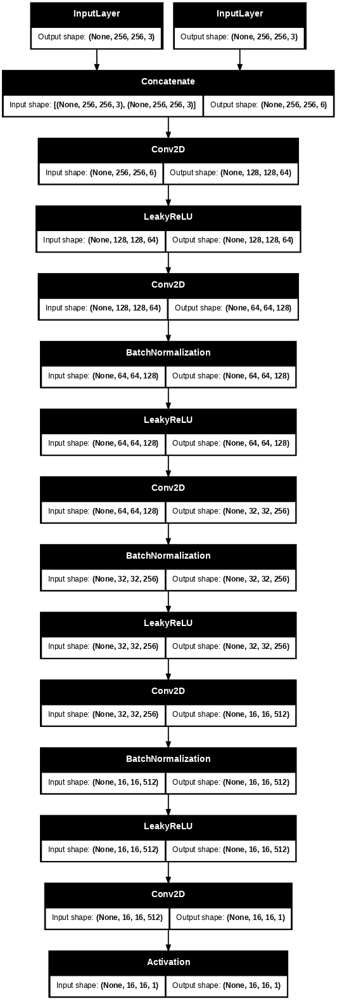

In [ ]:
tf.keras.utils.plot_model(Discriminator, show_shapes=True, dpi=64)

 ### Define Optimizers

In [ ]:
generator_optimizer = optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = optimizers.Adam(2e-4, beta_1=0.5)

 ### Define Losses

In [ ]:
loss_fn = tf.keras.losses.BinaryCrossentropy()
mae = tf.keras.losses.MeanAbsoluteError()

 ## Generator Losses

In [ ]:
def Generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_fn(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = mae(target, gen_output)
    gen_loss = gan_loss + (100 * l1_loss)
    return gen_loss

 ### Discrimantor Losses

In [ ]:
def Discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_fn(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_fn(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

 ### Training Function

In [ ]:
@tf.function()
def train_step(input_img, target_img):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated = Generator(input_img, training=True)

        disc_real = Discriminator([input_img, target_img], training=True)
        disc_generated = Discriminator([input_img, generated], training=True)

        gen_total_loss = Generator_loss(disc_generated, generated, target_img)

        Disc_loss = Discriminator_loss(disc_real, disc_generated)

    generator_gradients = gen_tape.gradient(gen_total_loss, Generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, Generator.trainable_variables))

    discriminator_gradients = disc_tape.gradient(Disc_loss, Discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, Discriminator.trainable_variables))

    return gen_total_loss, Disc_loss

In [ ]:
def reshape_images(input_img, target_img):
    input_img = tf.expand_dims(input_img, axis=0)
    target_img = tf.expand_dims(target_img, axis=0)
    return input_img, target_img

 ## Training

In [ ]:
generator_loss = []
discriminator_loss = []

epochs = 200
for epoch in range(epochs):
    for batch in Train_data.take(512):
        if isinstance(batch, tf.Tensor):
            print("Only one image tensor returned. Ensure the dataset yields pairs.")
            continue

        sat_img, map_img = batch

        sat_img, map_img = reshape_images(sat_img, map_img)

        gen_loss, disc_loss = train_step(sat_img, map_img)

        generator_loss.append(gen_loss)
        discriminator_loss.append(disc_loss)

    print(f"Epoch: {epoch+1}  Generator Loss: {gen_loss:.3f}  Discriminator Loss: {disc_loss:.3f}")

Epoch: 1  Generator Loss: 17.594  Discriminator Loss: 5.888

Epoch: 2  Generator Loss: 26.085  Discriminator Loss: 1.573

Epoch: 3  Generator Loss: 13.336  Discriminator Loss: 1.406

Epoch: 4  Generator Loss: 20.653  Discriminator Loss: 1.385

Epoch: 5  Generator Loss: 51.829  Discriminator Loss: 1.046

Epoch: 6  Generator Loss: 20.767  Discriminator Loss: 1.322

Epoch: 7  Generator Loss: 29.071  Discriminator Loss: 12.432

Epoch: 8  Generator Loss: 29.873  Discriminator Loss: 14.654

Epoch: 9  Generator Loss: 30.918  Discriminator Loss: 8.557

Epoch: 10  Generator Loss: 11.976  Discriminator Loss: 12.045

Epoch: 11  Generator Loss: 21.813  Discriminator Loss: 10.823

Epoch: 12  Generator Loss: 10.763  Discriminator Loss: 8.391

Epoch: 13  Generator Loss: 22.733  Discriminator Loss: 3.078

Epoch: 14  Generator Loss: 24.417  Discriminator Loss: 10.093

Epoch: 15  Generator Loss: 21.268  Discriminator Loss: 14.989

Epoch: 16  Generator Loss: 27.146  Discriminator Loss: 13.484

Epoch: 17 

 ### Denormalizing

In [ ]:
def denormalize(image):
    return (image * 127.5) + 127.5  #  [0, 255]

 ## Visulaliz Results (Generated Images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


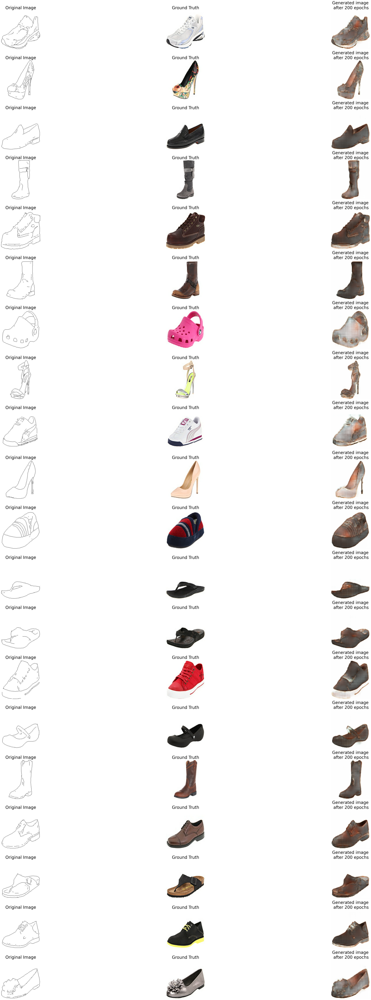

In [ ]:

def visualize_random_images_result(test_data, generator, num_images=20):
    # Convert test_data to a list to randomly sample images
    test_samples = list(test_data.as_numpy_iterator())

    random_indices = np.random.choice(len(test_samples), size=num_images, replace=False)

    plt.figure(figsize=(60, 100))

    for i, idx in enumerate(random_indices):
        x, y = test_samples[idx]

        preds = generator.predict(tf.expand_dims(x, axis=0))

        # Original Image
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(denormalize(x).astype('uint8'))
        plt.title('Original Image', fontsize=30)
        plt.axis('off')

        # Ground Truth
        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(denormalize(y).astype('uint8'))
        plt.title('Ground Truth', fontsize=30)
        plt.axis('off')

        # Generated image
        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(np.squeeze(denormalize(preds)).astype('uint8'))
        plt.title(f'Generated image\n after {epochs} epochs', fontsize=30)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_random_images_result(Test_data, Generator, num_images=20)

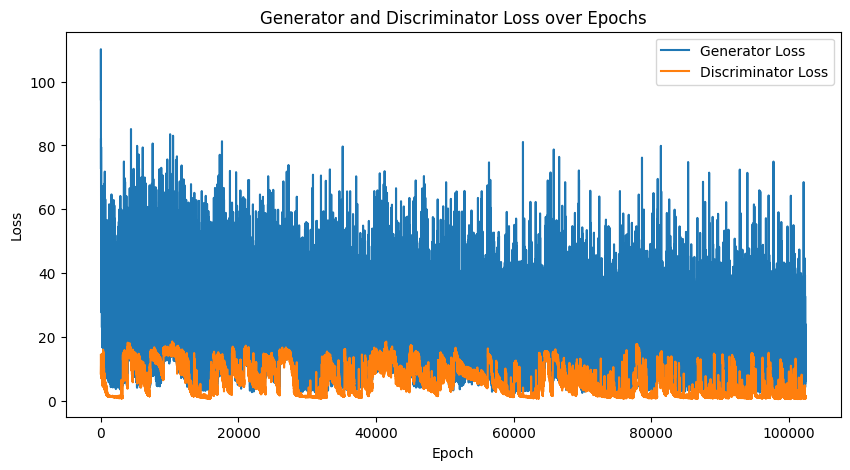

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(generator_loss, label='Generator Loss')
plt.plot(discriminator_loss, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator and Discriminator Loss over Epochs')
plt.legend()
plt.show()

In [ ]:
import pickle

In [ ]:
import pickle

# Specify the file path where you want to save the model
model_save_path = '/content/Generator.pkl'

# Save the entire model
with open(model_save_path, 'wb') as f:
    pickle.dump(Generator, f)

In [ ]:
from google.colab import files
files.download(model_save_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>